c:\Users\Chief Engineer (C)\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\Chief Engineer (C)\anaconda3\lib\site-packages\numpy\.libs\libopenblas.el2c6ple4zyw3eceviv3oxxgrn2nrfm2.gfortran-win_amd64.dll
c:\Users\Chief Engineer (C)\anaconda3\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
c:\Users\Chief Engineer (C)\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


((tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0431, 0.8471, 0.3412, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.6863, 0.9922, 0.3020, 0.0000, 0.000

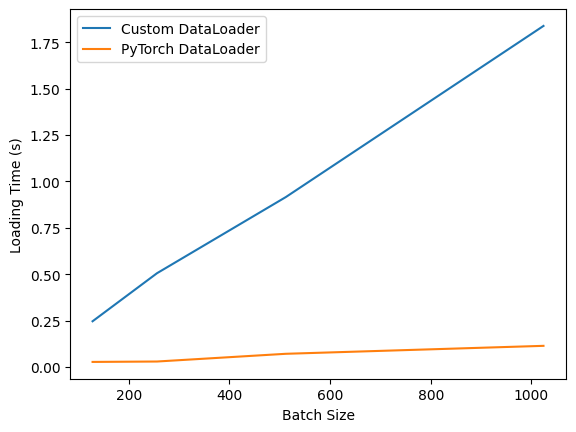

In [1]:
import torch
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import Sampler
import time
import math
import random
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

class MNISTDataset(Dataset):
    def __init__(self, root='./data', train=True, download=True, transform=None):
        self.data = datasets.MNIST(root=root, train=train, download=download, transform=transform)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        image, label = self.data[index]
        return image, label

class CustomDataLoader:
    def __init__(self, dataset, batch_size, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.num_samples = len(dataset)
        self.indices = list(range(self.num_samples))
        self.current_index = 0

        if self.shuffle:
            random.seed(42)
            random.shuffle(self.indices)

    def __iter__(self):
        return self

    def __next__(self):
        if self.current_index >= self.num_samples:
            raise StopIteration

        batch_indices = self.indices[self.current_index:self.current_index + self.batch_size]
        batch = [self.dataset[i] for i in batch_indices]
        self.current_index += self.batch_size

        return tuple(zip(*batch)) 

def measure_loading_time(dataloader):
    start_time = time.time()
    for data in dataloader:
        print(data)
        print(f" first element of the tuple's Size : {data[0][0].size(0)}")  # Access the first element of the tuple (images) and then access the size
        break 
    end_time = time.time()
    return end_time - start_time

# Define batch sizes
batch_sizes = [128, 256, 512, 1024]

# Initialize lists to store loading times
custom_loader_times = []
pytorch_loader_times = []

# Measure loading time for only no. of batch to get the whole dataset [ total time for given batch size]
for batch_size in batch_sizes:
    custom_dataset = MNISTDataset(transform=transforms.ToTensor())
    custom_dataloader = CustomDataLoader(custom_dataset, batch_size=batch_size, shuffle=True)
    custom_loading_time = measure_loading_time(custom_dataloader)
    custom_loader_times.append(custom_loading_time)

    pytorch_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transforms.ToTensor())
    pytorch_dataloader = DataLoader(pytorch_dataset, batch_size=batch_size, shuffle=True)
    pytorch_loading_time = measure_loading_time(pytorch_dataloader)
    pytorch_loader_times.append(pytorch_loading_time)

# Plot the results
plt.plot(batch_sizes, custom_loader_times, label='Custom DataLoader')
plt.plot(batch_sizes, pytorch_loader_times, label='PyTorch DataLoader')
plt.xlabel('Batch Size')
plt.ylabel('Loading Time (s)')
plt.legend()
plt.show()


- Pytorch DataLoader takes much less time as compared to custom dataloader
- The increase in time in Custom Dataloader, is very high ( the rate of change of time taken with respect to batch size)
- Th increase in time is much less in Pytorch Dataloader, ( the slope is very less in it case comparatively)


Question 2 : 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Define the neural network architecture
class FeedForwardNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(FeedForwardNN, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.relu3 = nn.ReLU()
        self.fc4 = nn.Linear(hidden_size, hidden_size)
        self.relu4 = nn.ReLU()
        self.fc5 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.relu1(self.fc1(x))
        x = self.relu2(self.fc2(x))
        x = self.relu3(self.fc3(x))
        x = self.relu4(self.fc4(x))
        x = self.fc5(x)
        return x

# Define the dataset and data loaders
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
train_dataset = torchvision.datasets.MNIST(root='./data', train=True, transform=transform, download=True)
test_dataset = torchvision.datasets.MNIST(root='./data', train=False, transform=transform, download=True)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Initialize the model, loss function, and optimizer
input_size = 28 * 28
hidden_size = 40
output_size = 10
model = FeedForwardNN(input_size, hidden_size, output_size)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.0003)

# Training loop
num_epochs = 60
train_losses, val_losses, test_losses = [], [], []
train_accuracies, val_accuracies, test_accuracies = [], [], []

for epoch in range(num_epochs):
    model.train()
    total_loss, correct_train = 0, 0

    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        correct_train += (predicted == labels).sum().item()

    train_loss = total_loss / len(train_loader)
    train_accuracy = correct_train / len(train_loader.dataset)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # Validation
    model.eval()
    val_loss, correct_val = 0, 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            correct_val += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = correct_val / len(test_loader.dataset)
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    # Testing
    model.eval()
    test_loss, correct_test = 0, 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            correct_test += (predicted == labels).sum().item()

    test_loss /= len(test_loader)
    test_accuracy = correct_test / len(test_loader.dataset)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)

    # Print progress
    print(f"Epoch {epoch+1}/{num_epochs}: "
          f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}, "
          f"Train Acc: {train_accuracy:.4f}, Val Acc: {val_accuracy:.4f}, Test Acc: {test_accuracy:.4f}")

# Plotting graphs
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train')
plt.plot(val_losses, label='Validation')
plt.plot(test_losses, label='Test')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train')
plt.plot(val_accuracies, label='Validation')
plt.plot(test_accuracies, label='Test')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


Implement everything defined in Question 2 completely from scratch. Also implement the back-propagation
algorithm from scratch using only PyTorch tensor operations (calling PyTorch backward function will fetch you
0 marks). Train the scratch implemented model with the same settings (epochs, learning rate) as in Question
2 and generate graphs depicting the loss and accuracy for training, validation, and testing. Compare the
performance of your custom back-propagation algorithm with PyTorch’s implementation and provide a report
on the results.

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Define the neural network architecture
class FeedForwardNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(FeedForwardNN, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.relu3 = nn.ReLU()
        self.fc4 = nn.Linear(hidden_size, hidden_size)
        self.relu4 = nn.ReLU()
        self.fc5 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.relu1(self.fc1(x))
        x = self.relu2(self.fc2(x))
        x = self.relu3(self.fc3(x))
        x = self.relu4(self.fc4(x))
        x = self.fc5(x)
        return x

def Softmax(outputs, dim=1):
    # Calculate the maximum value along the specified dimension
    max_values, _ = torch.max(outputs, dim, keepdim=True)

    # Subtract the maximum value for numerical stability
    shifted_outputs = outputs - max_values

    # Calculate the log of the sum of exponentials (log-sum-exp trick)
    log_sum_exp = torch.log(torch.sum(torch.exp(shifted_outputs), dim, keepdim=True))

    # Calculate the log softmax
    log_softmax = shifted_outputs - log_sum_exp

    return log_softmax

# Define the dataset and data loaders
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
train_dataset = torchvision.datasets.MNIST(root='./data', train=True, transform=transform, download=True)
test_dataset = torchvision.datasets.MNIST(root='./data', train=False, transform=transform, download=True)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Initialize the model, loss function, and optimizer
input_size = 28 * 28
hidden_size = 40
output_size = 10
model = FeedForwardNN(input_size, hidden_size, output_size)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.0003)

# Training loop
num_epochs = 60
learning_rate = 0.0003
train_losses, val_losses, test_losses = [], [], []
train_accuracies, val_accuracies, test_accuracies = [], [], []

for epoch in range(num_epochs):
    model.train()
    total_loss, correct_train = 0, 0

    for inputs, labels in train_loader:
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass from scratch
        model.zero_grad()  
        
        # Backward pass
        d_loss_dy = 1.0  # Gradient of the loss with respect to the final output

        # Backpropagate through each layer
        d_loss_dz5 = d_loss_dy * Softmax(outputs, dim=1).T

        # Transpose operation should be applied to the input of Softmax
        d_loss_dz5.backward(torch.eye(outputs.shape[1]).T)

        # Rest of the code remains unchanged

        d_loss_dx4 = model.fc5.backward(d_loss_dz5)
        d_loss_dz4 = d_loss_dx4 * (model.fc4.input > 0).float()
        
        d_loss_dx3 = model.fc4.backward(d_loss_dz4)
        d_loss_dz3 = d_loss_dx3 * (model.fc3.input > 0).float()
        
        d_loss_dx2 = model.fc3.backward(d_loss_dz3)
        d_loss_dz2 = d_loss_dx2 * (model.fc2.input > 0).float()
        
        d_loss_dx1 = model.fc2.backward(d_loss_dz2)
        d_loss_dz1 = d_loss_dx1 * (model.fc1.input > 0).float()

        model.fc1.backward(d_loss_dz1)

        # Update parameters using basic gradient descent
        with torch.no_grad():
            for param in model.parameters():
                if param.requires_grad:
                    param.data -= learning_rate * param.grad

        total_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        correct_train += (predicted == labels).sum().item()

    train_loss = total_loss / len(train_loader)
    train_accuracy = correct_train / len(train_loader.dataset)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # Validation
    model.eval()
    val_loss, correct_val = 0, 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            correct_val += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = correct_val / len(test_loader.dataset)
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    # Testing
    model.eval()
    test_loss, correct_test = 0, 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            correct_test += (predicted == labels).sum().item()

    test_loss /= len(test_loader)
    test_accuracy = correct_test / len(test_loader.dataset)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)

    # Print progress
    print(f"Epoch {epoch+1}/{num_epochs}: "
          f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Test Loss: {test_loss:.4f}, "
          f"Train Acc: {train_accuracy:.4f}, Val Acc: {val_accuracy:.4f}, Test Acc: {test_accuracy:.4f}")

# Plotting graphs
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train')
plt.plot(val_losses, label='Validation')
plt.plot(test_losses, label='Test')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train')
plt.plot(val_accuracies, label='Validation')
plt.plot(test_accuracies, label='Test')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


RuntimeError: Mismatch in shape: grad_output[0] has a shape of torch.Size([10, 10]) and output[0] has a shape of torch.Size([10, 64]).